# Read a HDF5 dataset (INSAT_L1B_STD) and draw a simple plot and save in .tif format

##Import necessary modules

In [ ]:
import h5py
import numpy as np
import matplotlib.pyplot as plt

In [2]:
###################Read the file##################################

hf = h5py.File('/mnt/e/Python_DEMO_Scripts/3DIMG_21FEB2021_0900_L1B_STD.h5', 'r')
list(hf.keys())               # Print the list of datasets in the file
list(hf.items())

[('GeoX', <HDF5 dataset "GeoX": shape (2805,), type "<i4">),
 ('GeoX1', <HDF5 dataset "GeoX1": shape (1402,), type "<i4">),
 ('GeoX2', <HDF5 dataset "GeoX2": shape (11220,), type "<i4">),
 ('GeoY', <HDF5 dataset "GeoY": shape (2816,), type "<i4">),
 ('GeoY1', <HDF5 dataset "GeoY1": shape (1408,), type "<i4">),
 ('GeoY2', <HDF5 dataset "GeoY2": shape (11264,), type "<i4">),
 ('GreyCount', <HDF5 dataset "GreyCount": shape (1024,), type "<i4">),
 ('IMG_MIR', <HDF5 dataset "IMG_MIR": shape (1, 2816, 2805), type "<u2">),
 ('IMG_MIR_RADIANCE',
  <HDF5 dataset "IMG_MIR_RADIANCE": shape (1024,), type "<f4">),
 ('IMG_MIR_TEMP', <HDF5 dataset "IMG_MIR_TEMP": shape (1024,), type "<f4">),
 ('IMG_SWIR', <HDF5 dataset "IMG_SWIR": shape (1, 11264, 11220), type "<u2">),
 ('IMG_SWIR_RADIANCE',
  <HDF5 dataset "IMG_SWIR_RADIANCE": shape (1024,), type "<f4">),
 ('IMG_TIR1', <HDF5 dataset "IMG_TIR1": shape (1, 2816, 2805), type "<u2">),
 ('IMG_TIR1_RADIANCE',
  <HDF5 dataset "IMG_TIR1_RADIANCE": shape (10

In [3]:
###################Read the required dataset from the file and see attributes####################
mir_img=np.squeeze(hf['IMG_MIR'][:])
print(mir_img.shape)
dict(hf['IMG_MIR'].attrs.items())      #Prints the attributes of the dataset

(2816, 2805)


{'DIMENSION_LIST': array([array([<HDF5 object reference>], dtype=object),
        array([<HDF5 object reference>], dtype=object),
        array([<HDF5 object reference>], dtype=object)], dtype=object),
 'long_name': b'Middle Infrared Count',
 'invert': b'true',
 'central_wavelength': array([3.9313], dtype=float32),
 'bandwidth': array([0.2], dtype=float32),
 'wavelength_unit': b'micron',
 'bits_per_pixel': array([10], dtype=int32),
 'resolution': array([4.], dtype=float32),
 'resolution_unit': b'km',
 '_FillValue': array([1023], dtype=uint16),
 'lab_radiance_scale_factor': array([0.00027955], dtype=float32),
 'lab_radiance_add_offset': array([-0.00418365], dtype=float32),
 'lab_radiance_quad': array([-1.31797e-07]),
 'lab_radiance_scale_factor_gsics': array([0.00039772], dtype=float32),
 'lab_radiance_add_offset_gsics': array([-0.0100492], dtype=float32),
 'lab_radiance_quad_gsics': array([-1.87507e-07]),
 'radiance_units': b'mW.cm-2.sr-1.micron-1',
 'coordinates': b'time Latitude Long

In [4]:
#######################Mask the data where there is fill value#########################
mir_img_mask=np.ma.masked_where(mir_img == hf['IMG_MIR'].attrs['_FillValue'], mir_img )

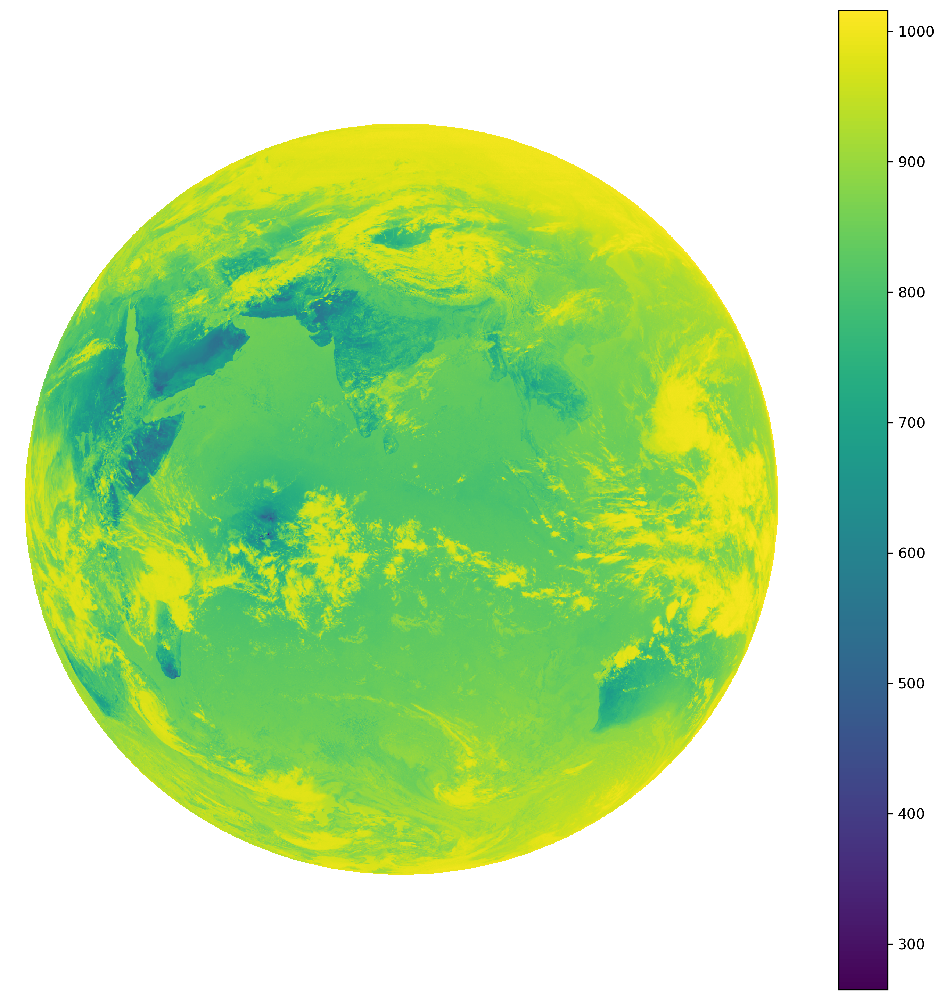

In [5]:
######################To create a simple plot using matplotlib########################
dpi = 300 # Arbitrary. The number of pixels in the image will always be identical
height, width = np.array(mir_img_mask.shape, dtype=float) / dpi
fig = plt.figure(figsize=(width, height), dpi=dpi)
ax = fig.add_axes([0, 0, 1, 1])
ax.axis('off')

im=ax.imshow(mir_img_mask, interpolation='none')
fig.savefig('test.tif', dpi=dpi)
plt.colorbar(im)
fig.savefig('hdf5.png', dpi=dpi)

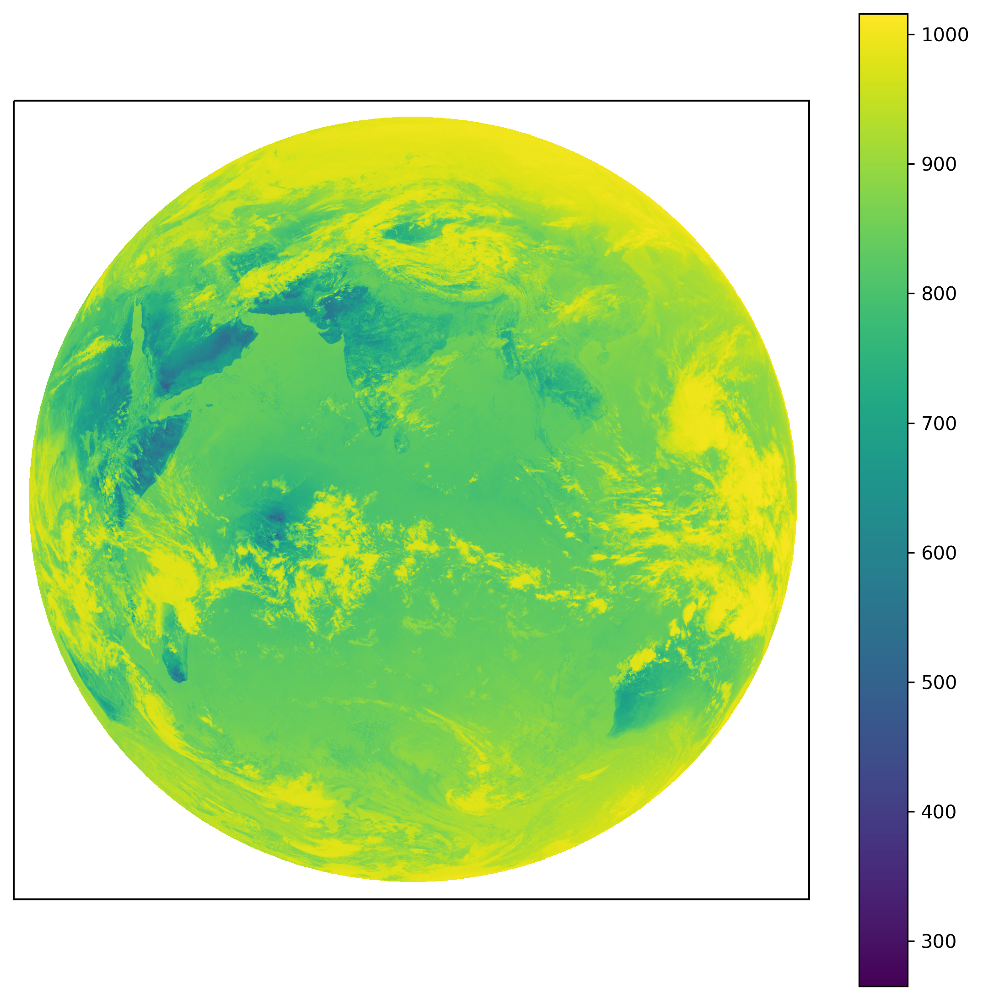

In [37]:
##############To specify the projection using cartopy and save the plot in .tif#############
import cartopy
import cartopy.crs as ccrs


dpi = 300 # Arbitrary. The number of pixels in the image will always be identical
height, width = np.array(mir_img_mask.shape, dtype=float) / dpi
fig = plt.figure(figsize=(width, height), dpi=dpi)
ax = fig.add_axes([0, 0, 1, 1])

globe=ccrs.Globe(ellipse='WGS84')
ax = plt.axes(projection=ccrs.PlateCarree(globe=globe)) 
c=plt.imshow(mir_img_mask,cmap='viridis')      
plt.colorbar(c)
plt.show()
fig.savefig('test1.tif', dpi=dpi)